# --Level1-Task1-Data Exploration and Preprocessing


In [1]:
#Here first we need to import all required libraries for this task.
"""pip install pandas"""
"""pip install matlplotlib """
"""pip install seaborn"""
"""pip install folium"""

'pip install folium'

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Task1: Loading the Dataset .CSV file
file_path = 'Dataset .csv'
data = pd.read_csv(file_path)

#Number of rows and columns in a dataset
rows, columns = data.shape
print(f"The dataset contains {rows} rows and {columns} columns.")



The dataset contains 9551 rows and 21 columns.


In [3]:
#Task2: Checking for missing values
missing_values = data.isnull().sum()
print(missing_values)

#And aslo Handling missing values
data['Cuisines'].fillna('Unknown', inplace=True)

#Checking the  data types of each column
data_types = data.dtypes
print(data_types)



Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64
Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      

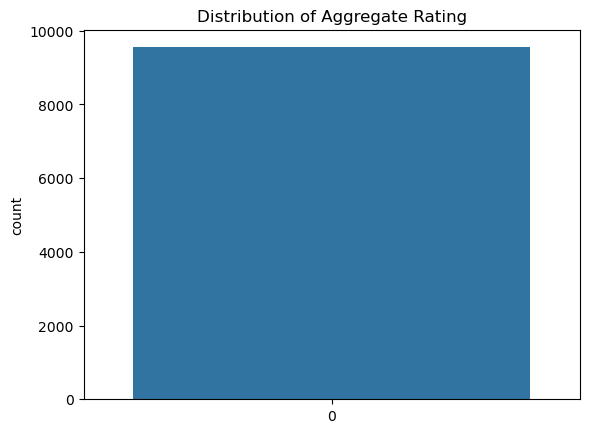

In [4]:
#Task3: Analyzing the distribution of the target variable
#Here I'm using seaborn library to analyze
sns.countplot(data['Aggregate rating'])
plt.title('Distribution of Aggregate Rating')
plt.show()

# --Level1-Task2-Descriptive Analysis--


In [5]:
#Task1: Calculating basic statistical measures for numerical columns
#Here we can use data.describe() method to get all numerical summary of the dataset.
numerical_summary = data.describe()
print("\nBasic Statistical Measures for Numerical Columns:")
print(numerical_summary)


Basic Statistical Measures for Numerical Columns:
       Restaurant ID  Country Code    Longitude     Latitude  \
count   9.551000e+03   9551.000000  9551.000000  9551.000000   
mean    9.051128e+06     18.365616    64.126574    25.854381   
std     8.791521e+06     56.750546    41.467058    11.007935   
min     5.300000e+01      1.000000  -157.948486   -41.330428   
25%     3.019625e+05      1.000000    77.081343    28.478713   
50%     6.004089e+06      1.000000    77.191964    28.570469   
75%     1.835229e+07      1.000000    77.282006    28.642758   
max     1.850065e+07    216.000000   174.832089    55.976980   

       Average Cost for two  Price range  Aggregate rating         Votes  
count           9551.000000  9551.000000       9551.000000   9551.000000  
mean            1199.210763     1.804837          2.666370    156.909748  
std            16121.183073     0.905609          1.516378    430.169145  
min                0.000000     1.000000          0.000000      0.000000

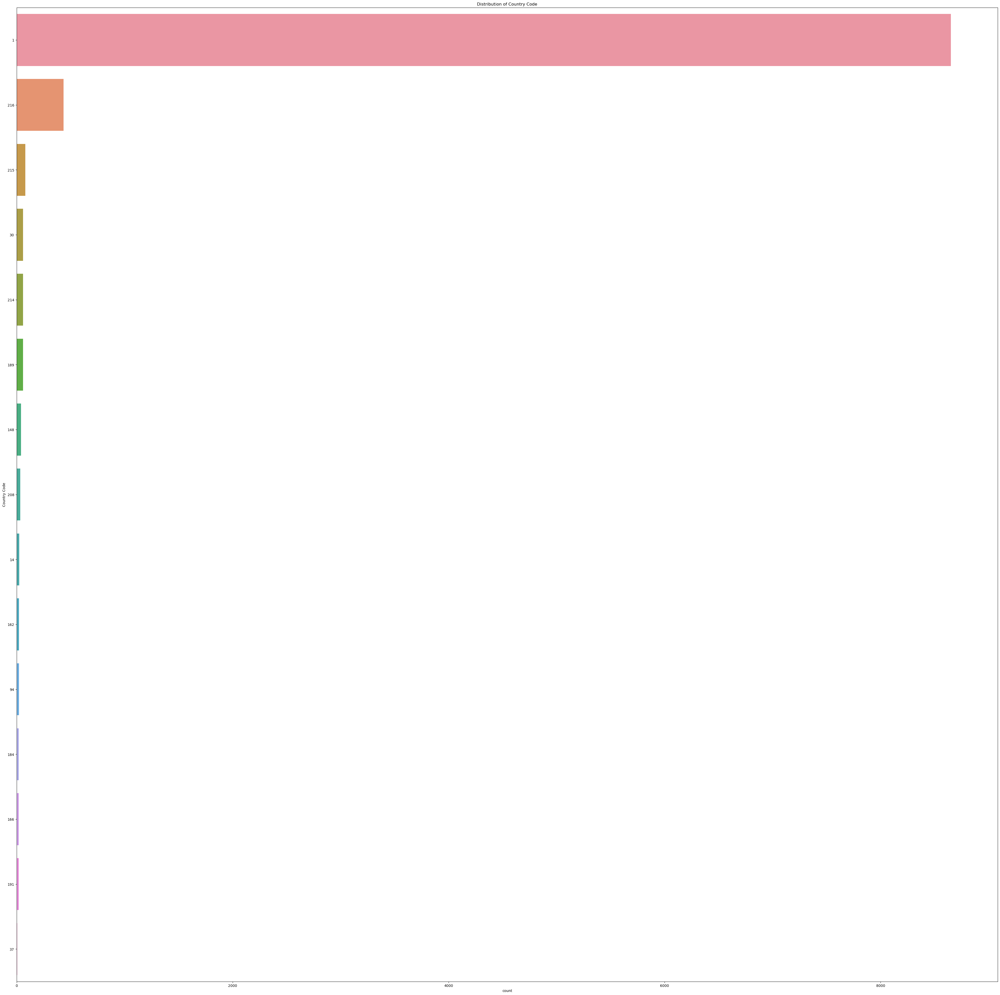

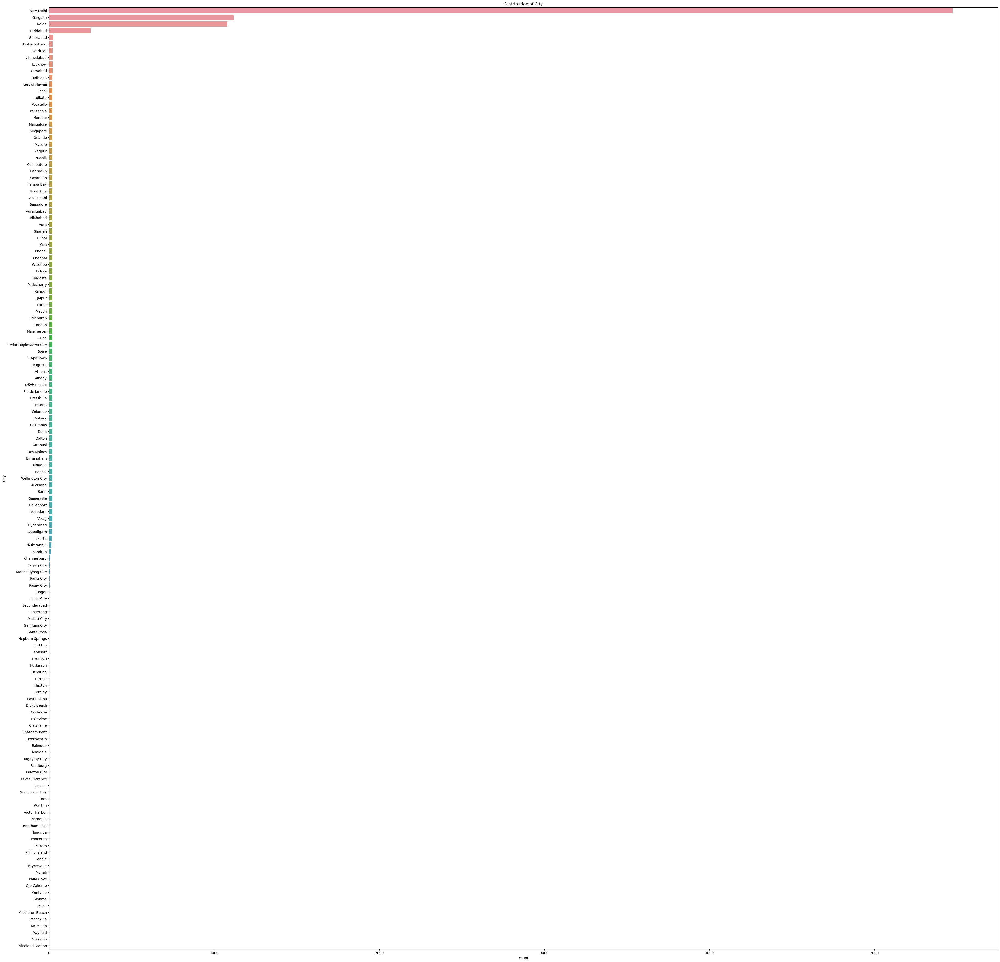

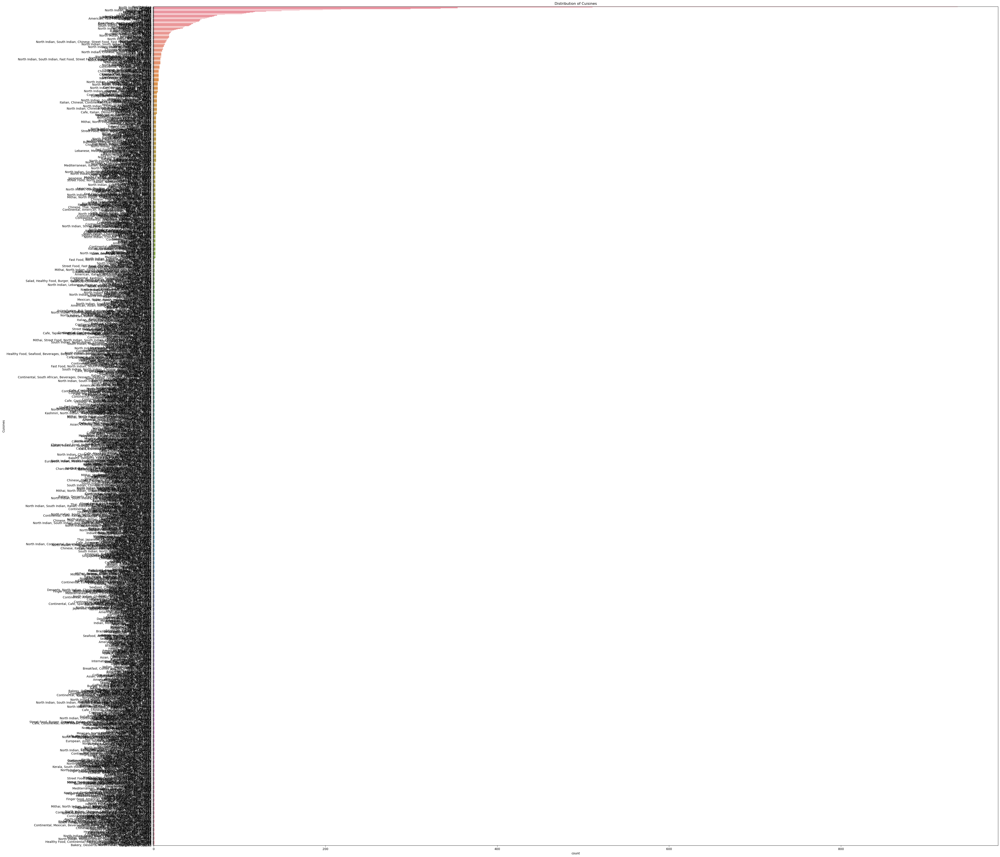

In [6]:
#Task2: Exploring the distribution of categorical variables
categorical_columns = ['Country Code', 'City', 'Cuisines']
#Here I'm using for loop to go through each column
for col in categorical_columns:
    #Here I'm increasing the figure size just for visibility just zoom-in to see the results of each country
    plt.figure(figsize=(50, 50))
    sns.countplot(y=data[col], order=data[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.show()

In [7]:
#Task3:  Identifying the top cuisines and cities with the highest number of restaurants
top_cuisines = data['Cuisines'].value_counts().head(10)
print("\nTop 10 Cuisines with the Highest Number of Restaurants:")
print(top_cuisines)

top_cities = data['City'].value_counts().head(10)
print("\nTop 10 Cities with the Highest Number of Restaurants:")
print(top_cities)


Top 10 Cuisines with the Highest Number of Restaurants:
Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64

Top 10 Cities with the Highest Number of Restaurants:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


# --Level1-Task3-Geospatial Analysis--

In [8]:
#Task1: Visualizing the locations of restaurants on a map using latitude and longitude information.
import folium
from folium.plugins import MarkerCluster
data = data.dropna(subset=['Latitude', 'Longitude'])

map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=12)

# Adding  marker clusters to the map
marker_cluster = MarkerCluster().add_to(mymap)

# Adding markers for each restaurant
for idx, row in data.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(marker_cluster)

# Saving the map as an HTML file
mymap.save('restaurant_locations_map.html')
print("Restaurant locations map saved as 'restaurant_locations_map.html'.")

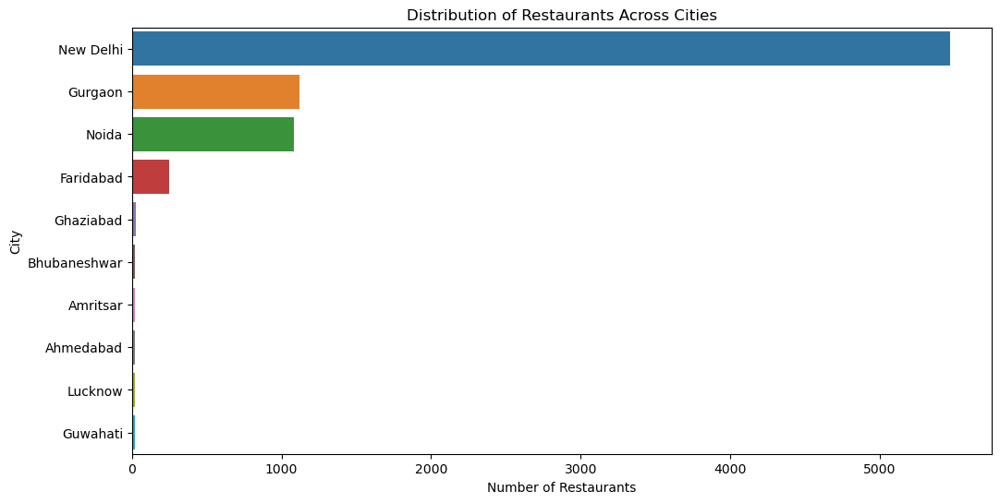

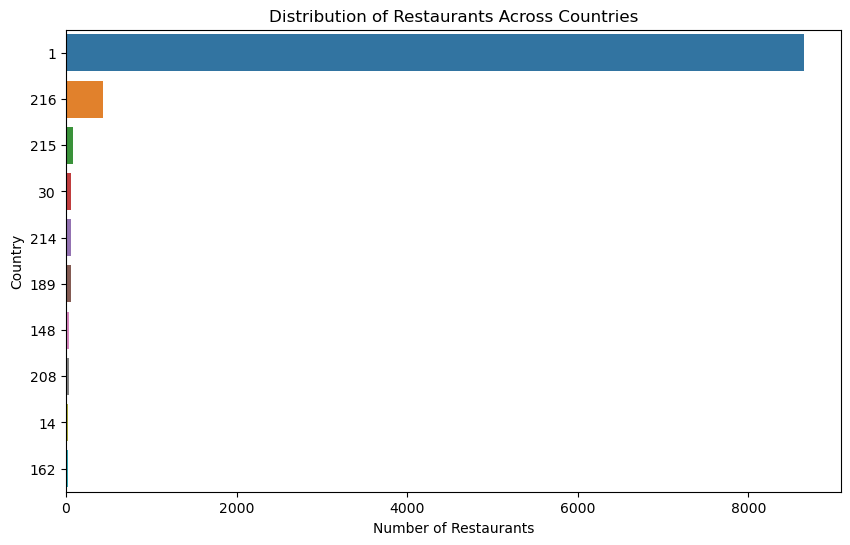

In [ ]:
# Task 2: Analyze the distribution of restaurants across different cities or countries
import matplotlib.pyplot as plt

# Countplot for cities
plt.figure(figsize=(12, 6))
sns.countplot(y='City', data=data, order=data['City'].value_counts().index[:10])
plt.title('Distribution of Restaurants Across Cities')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()

# Countplot for countries
plt.figure(figsize=(10, 6))
sns.countplot(y='Country Code', data=data, order=data['Country Code'].value_counts().index[:10])
plt.title('Distribution of Restaurants Across Countries')
plt.xlabel('Number of Restaurants')
plt.ylabel('Country')
plt.show()


Correlation Matrix:
                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


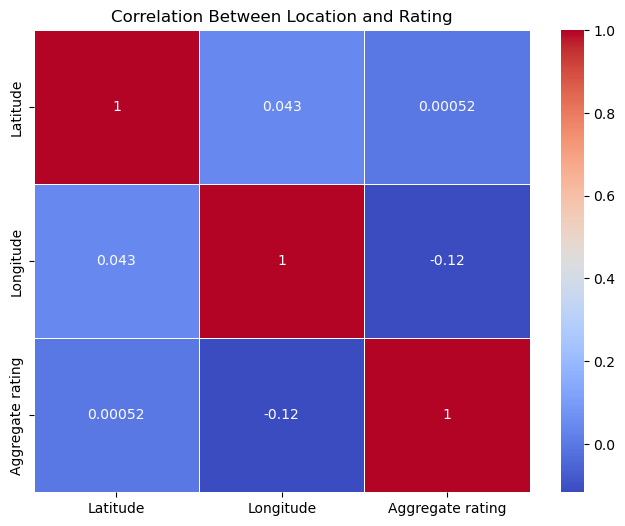

In [ ]:
#Task 3: Determine correlation between location and rating
correlation = data[['Latitude', 'Longitude', 'Aggregate rating']].corr()

print("Correlation Matrix:")
print(correlation)

# Visualize correlation using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Between Location and Rating')
plt.show()

# --Level2-Task1-Table Booking and Online Delivery--

In [ ]:
#Task1: Determined the percentage of restaurants that offer table booking and online delivery.
total_restaurants = len(data)
restaurants_with_tb = data[data['Has Table booking'] == 'Yes']
restaurants_with_od = data[data['Has Online delivery'] == 'Yes']
restaurants_with_tb_and_od = data[(data['Has Table booking'] == 'Yes') & (data['Has Online delivery'] == 'Yes')]

percentage_tb_and_od = (len(restaurants_with_tb_and_od) / total_restaurants) * 100

print(f"Percentage of restaurants offering both table booking and online delivery: {percentage_tb_and_od:.2f}%")

Percentage of restaurants offering both table booking and online delivery: 4.55%


In [ ]:
#Task2: Comparing the average ratings of restaurants with table booking and those without.
avg_rating_with_tb = data[data['Has Table booking'] == 'Yes']['Aggregate rating'].mean()
avg_rating_without_tb = data[data['Has Table booking'] == 'No']['Aggregate rating'].mean()

print(f"Average rating of restaurants with table booking: {avg_rating_with_tb:.2f}")
print(f"Average rating of restaurants without table booking: {avg_rating_without_tb:.2f}")

Average rating of restaurants with table booking: 3.44
Average rating of restaurants without table booking: 2.56


In [ ]:
#Task3: Analyze the availability of online delivery among restaurants with different price ranges.
price_ranges = data['Price range'].unique()

for price_range in price_ranges:
    restaurants_in_range = data[data['Price range'] == price_range]
    total_restaurants_in_range = len(restaurants_in_range)
    restaurants_with_od_in_range = restaurants_in_range[restaurants_in_range['Has Online delivery'] == 'Yes']
    percentage_od_in_range = (len(restaurants_with_od_in_range) / total_restaurants_in_range) * 100

    print(f"\nPrice Range: {price_range}")
    print(f"Total restaurants in this price range: {total_restaurants_in_range}")
    print(f"Percentage of restaurants with online delivery: {percentage_od_in_range:.2f}%")


Price Range: 3
Total restaurants in this price range: 1408
Percentage of restaurants with online delivery: 29.19%

Price Range: 4
Total restaurants in this price range: 586
Percentage of restaurants with online delivery: 9.04%

Price Range: 2
Total restaurants in this price range: 3113
Percentage of restaurants with online delivery: 41.31%

Price Range: 1
Total restaurants in this price range: 4444
Percentage of restaurants with online delivery: 15.77%


# --Level2-Task2- Price Range Analysis--

In [ ]:
# Task 1: Determined the most common price range among all the restaurants
most_common_price_range = data['Price range'].mode()[0]
print(f"The most common price range among all restaurants is: {most_common_price_range}")

The most common price range among all restaurants is: 1


In [ ]:
# Task 2: Calculating the average rating for each price range
average_rating_per_price_range = data.groupby('Price range')['Aggregate rating'].mean().reset_index()
print("\nAverage rating for each price range:")
print(average_rating_per_price_range)


Average rating for each price range:
   Price range  Aggregate rating
0            1          1.999887
1            2          2.941054
2            3          3.683381
3            4          3.817918


In [ ]:
# Task 3: Identifying  the color that represents the highest average rating among different price ranges
highest_rating_color = average_rating_per_price_range.loc[average_rating_per_price_range['Aggregate rating'].idxmax(), 'Price range']

print(f"\nThe color representing the highest average rating among different price ranges is: {highest_rating_color}")


The color representing the highest average rating among different price ranges is: 4


# --Level2-Task3-Feature Engineering--

In [ ]:
# 1. Extract additional features: Length of restaurant name and address
data['Restaurant Name Length'] = data['Restaurant Name'].apply(len)
data['Address Length'] = data['Address'].apply(len)

In [ ]:
# 2. Create new features by encoding categorical variables
# Converting 'Has Table booking' and 'Has Online delivery' to binary indicators
data['Has Table Booking'] = (data['Has Table booking'] == 'Yes').astype(int)
data['Has Online Delivery'] = (data['Has Online delivery'] == 'Yes').astype(int)


In [ ]:
#Printing top 5 records from the updated dataset
print("\nUpdated dataset with additional and new features:")
print(data.head())


Updated dataset with additional and new features:
   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa 

In [ ]:
# Save the updated dataset with new features
# Here I'm using raw string('r') which gives the raw file_path to save in a particular location.
updated_file_path = r'C:\Users\HP\OneDrive\Desktop\Cognifyz_Technologies\Updated_Dataset.csv'
data.to_csv(updated_file_path, index=False)
print(f"\nUpdated dataset saved as '{updated_file_path}'")


Updated dataset saved as 'C:\Users\HP\OneDrive\Desktop\Cognifyz_Technologies\Updated_Dataset.csv'


# --Level3-Task1-Predictive Modeling--

In [ ]:

pip install -U scikit-learn


  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/ae/20/6d1a0a61d468b37a142fd90bb93c73bc1c2205db4a69ac630ed218c31612/scikit_learn-1.5.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for threadpoolctl>=3.1.0 from https://files.pythonhosted.org/packages/4b/2c/ffbf7a134b9ab11a67b0cf0726453cedd9c5043a4fe7a35d1cefa9a1bcfb/threadpoolctl-3.5.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/11.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/11.0 MB ? eta -:--:--
   ---------------------------------------- 0.1/11.0 MB 648.1 kB/s eta 0:00:17
   ---------------------------------------- 0.1/11.0 MB 819.2 kB/s eta 0:00:14
    --------------------------------------- 0.2/11.0 MB 1.1 MB/s eta 0:00:10
   - -------------------------------------- 0.3/11.0 MB 1.1 MB/s eta 0:00:10
   - -------------------------------------- 0.3/11.0 MB 1.3 MB/s eta 0:00:09
   - -----------------------------

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Load the CSV file
file_path = r'C:\Users\HP\OneDrive\Desktop\Cognifyz_Technologies\Dataset .csv'
data = pd.read_csv(file_path)

# Preprocessing: Handle categorical variables and select relevant features
# Convert categorical variables to numerical values
data['Has Online delivery'] = data['Has Online delivery'].map({'No': 0, 'Yes': 1})

# Example: Selecting features and target variable
X = data[['Votes', 'Average Cost for two', 'Price range', 'Has Online delivery']]
y = data['Aggregate rating']

# Split dataset into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Function to evaluate model performance
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = mse ** 0.5
    r2 = r2_score(y_test, y_pred)
    return rmse, r2

# Initialize and train different regression models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=42),
    'Random Forest Regressor': RandomForestRegressor(random_state=42)
}

results = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    rmse, r2 = evaluate_model(model, X_test, y_test)
    results[name] = {'RMSE': rmse, 'R2 Score': r2}

# Display results
print("\nModel Performance Metrics:")
for name, result in results.items():
    print(f"\n{name}:")
    print(f"  RMSE: {result['RMSE']:.2f}")
    print(f"  R2 Score: {result['R2 Score']:.2f}")



Model Performance Metrics:

Linear Regression:
  RMSE: 1.30
  R2 Score: 0.26

Decision Tree Regressor:
  RMSE: 0.45
  R2 Score: 0.91

Random Forest Regressor:
  RMSE: 0.37
  R2 Score: 0.94


# --Level3-Task2-Customer Preference Analysis--

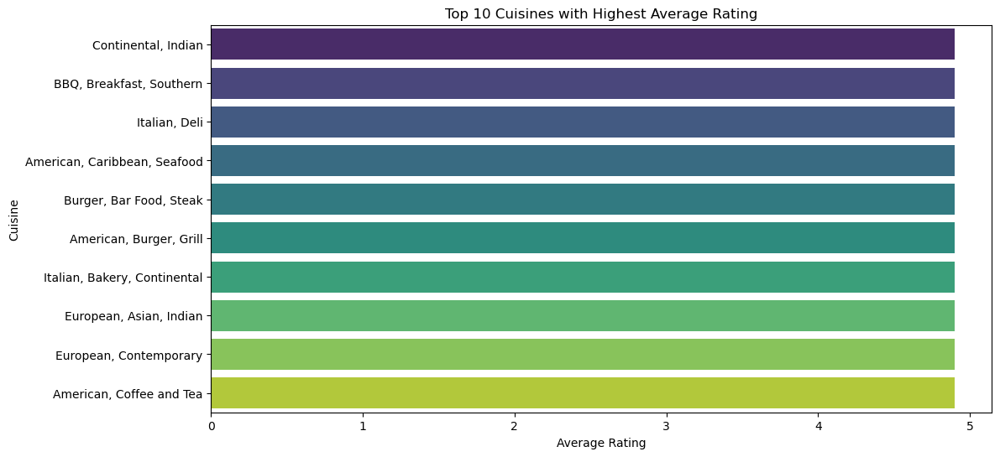

In [ ]:
# Task 1: Analyze the relationship between cuisine type and restaurant's rating

# Group by cuisine and calculate average rating
avg_rating_by_cuisine = data.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False).reset_index()

# Plotting the relationship
plt.figure(figsize=(12, 6))
sns.barplot(x='Aggregate rating', y='Cuisines', data=avg_rating_by_cuisine.head(10), palette='viridis')
plt.title('Top 10 Cuisines with Highest Average Rating')
plt.xlabel('Average Rating')
plt.ylabel('Cuisine')
plt.show()

In [ ]:
# Task 2: Identify the most popular cuisines based on the number of votes
top_cuisines_by_votes = data.groupby('Cuisines')['Votes'].sum().sort_values(ascending=False).head(10)

print("\nTop 10 Most Popular Cuisines Based on Number of Votes:")
print(top_cuisines_by_votes)


Top 10 Most Popular Cuisines Based on Number of Votes:
Cuisines
North Indian, Mughlai             53747
North Indian                      46241
North Indian, Chinese             42012
Cafe                              30657
Chinese                           21925
North Indian, Mughlai, Chinese    20115
Fast Food                         17852
South Indian                      16433
Mughlai, North Indian             15275
Italian                           14799
Name: Votes, dtype: int64


In [ ]:
# Task 3: Determine if there are specific cuisines that tend to receive higher ratings
# Plotting average ratings for each cuisine
plt.figure(figsize=(500, 400))
sns.boxplot(x='Aggregate rating', y='Cuisines', data=data, palette='Set3', showfliers=False)
plt.title('Distribution of Ratings Across Cuisines')
plt.xlabel('Aggregate Rating')
plt.ylabel('Cuisine')
plt.show()

# --Level3-Task3-Data Visualization--

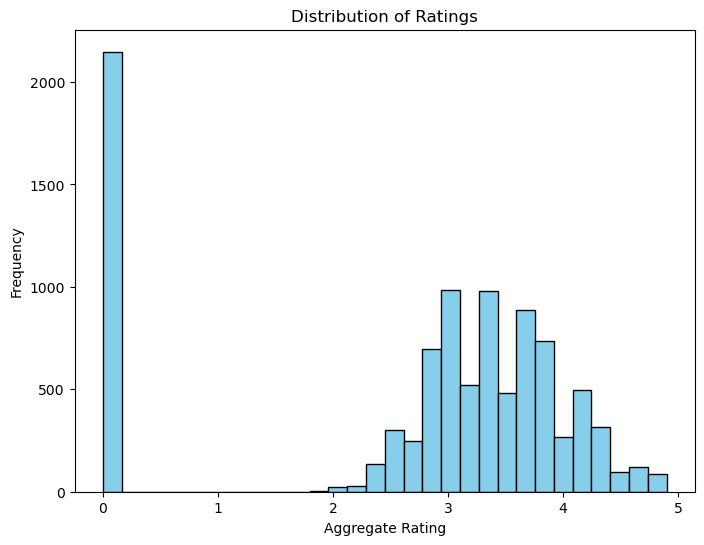

In [ ]:
# Task 1: Distribution of Ratings

# Histogram of ratings
plt.figure(figsize=(8, 6))
plt.hist(data['Aggregate rating'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()

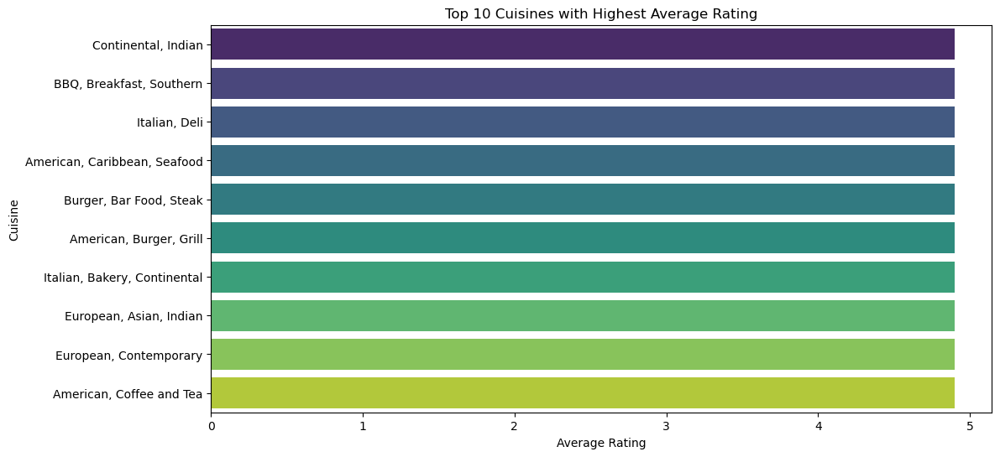

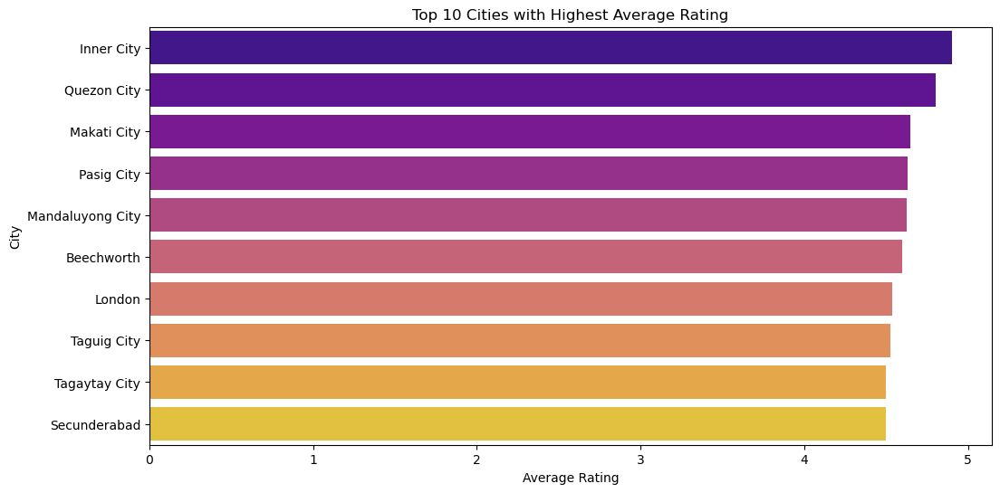

In [ ]:
# Task 2: Compare Average Ratings of Different Cuisines or Cities

# Average ratings by cuisine
avg_rating_by_cuisine = data.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False).reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='Aggregate rating', y='Cuisines', data=avg_rating_by_cuisine.head(10), palette='viridis')
plt.title('Top 10 Cuisines with Highest Average Rating')
plt.xlabel('Average Rating')
plt.ylabel('Cuisine')
plt.show()

# Average ratings by city
avg_rating_by_city = data.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='Aggregate rating', y='City', data=avg_rating_by_city.head(10), palette='plasma')
plt.title('Top 10 Cities with Highest Average Rating')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.show()

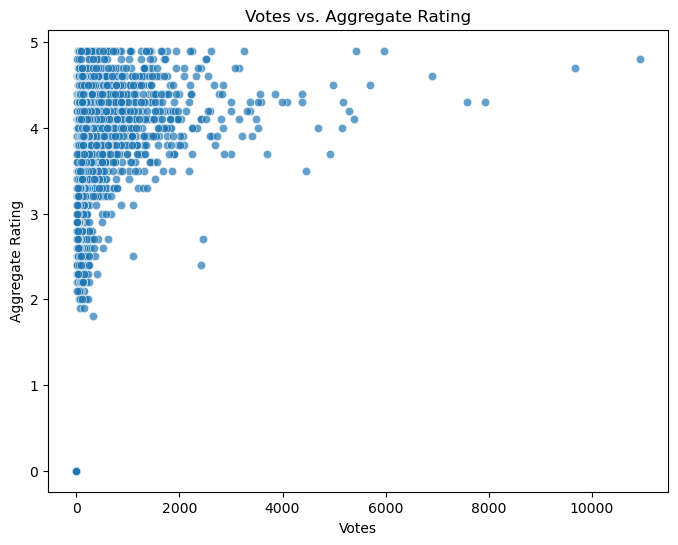

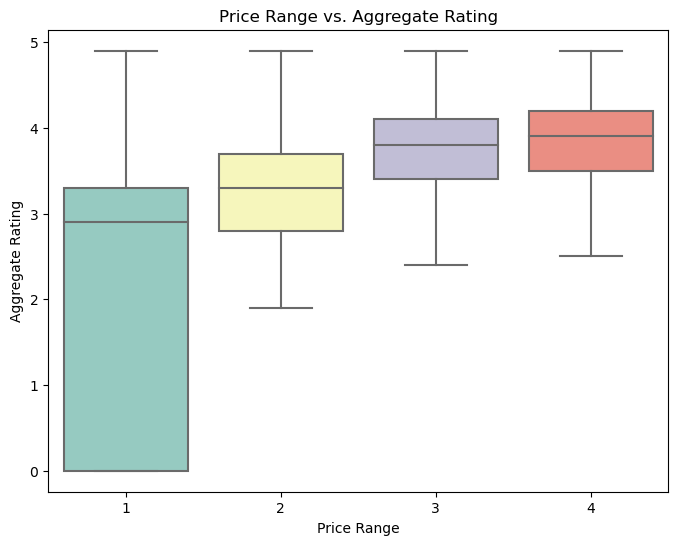

In [ ]:
# Task 3: Visualize Relationship Between Various Features and Target Variable (Aggregate Rating)

# Example: Scatter plot of votes vs. aggregate rating
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=data, alpha=0.7)
plt.title('Votes vs. Aggregate Rating')
plt.xlabel('Votes')
plt.ylabel('Aggregate Rating')
plt.show()

# Example: Box plot of price range vs. aggregate rating
plt.figure(figsize=(8, 6))
sns.boxplot(x='Price range', y='Aggregate rating', data=data, palette='Set3', showfliers=False)
plt.title('Price Range vs. Aggregate Rating')
plt.xlabel('Price Range')
plt.ylabel('Aggregate Rating')
plt.show()

# --End - Of - Task--